In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
data = pd.read_csv('../Data/selected_data/merged_data.csv')
data.info()

C:\Users\BIMBARA\AppData\Local\Temp\ipykernel_27016\1736518648.py:6: DtypeWarning: Columns (33,34) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../Data/selected_data/merged_data.csv')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 217242 entries, 0 to 217241
Data columns (total 35 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Index                217242 non-null  int64  
 1   batter               217242 non-null  object 
 2   bowler               217242 non-null  object 
 3   non_striker          217242 non-null  object 
 4   runs_by_bat          217242 non-null  int64  
 5   extra_runs           217242 non-null  int64  
 6   total_runs_delivery  217242 non-null  int64  
 7   current_team_total   217242 non-null  int64  
 8   runs_remain          103118 non-null  float64
 9   batter_runs          217242 non-null  int64  
 10  balls_faced          217242 non-null  int64  
 11  wickets_fallen       217242 non-null  int64  
 12  extra_type           217242 non-null  object 
 13  delivery             217242 non-null  float64
 14  over                 217242 non-null  int64  
 15  wicket_type      

In [3]:
import pandas as pd

# Load the data
data = pd.read_csv('../Data/selected_data/merged_data.csv')

# Identify inning boundaries
inning_boundaries_indices = data[data['Index'] == 0].index
inning_boundaries_indices = list(inning_boundaries_indices) + [len(data)]  # Add end index for last inning

# Function to calculate top 6 players based on runs scored
def get_top6_batsmen(inning_df):
    batsmen_stats = inning_df.groupby('batter')['runs_by_bat'].sum()
    top6_batsmen = batsmen_stats.nlargest(6).reset_index()
    return top6_batsmen

# Iterate through each inning and get the top 6 players
inning_data = []
for i in range(len(inning_boundaries_indices) - 1):
    start_index = inning_boundaries_indices[i]
    end_index = inning_boundaries_indices[i + 1]
    inning_df = data.iloc[start_index:end_index]

    top6_batsmen = get_top6_batsmen(inning_df)

    inning_data.append({
        'inning': i + 1,
        'top6_batsmen': top6_batsmen,
    })

# Display the results
for inning in inning_data:
    print(f"Inning {inning['inning']}")
    print("Top 6 Batsmen:")
    print(inning['top6_batsmen'])
    print("\n")


C:\Users\BIMBARA\AppData\Local\Temp\ipykernel_27396\3501235428.py:4: DtypeWarning: Columns (33,34) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../Data/selected_data/merged_data.csv')


Inning 1
Top 6 Batsmen:
         batter  runs_by_bat
0      AJ Finch           43
1     M Klinger           38
2       TM Head           31
3     AJ Turner           18
4  MC Henriques           17
5   JP Faulkner           14


Inning 2
Top 6 Batsmen:
            batter  runs_by_bat
0    DAS Gunaratne           52
1   EMDY Munaweera           44
2      N Dickwella           30
3  TAM Siriwardana           15
4    CK Kapugedera           10
5       S Prasanna            8


Inning 3
Top 6 Batsmen:
         batter  runs_by_bat
0  MC Henriques           56
1     M Klinger           43
2       BR Dunk           32
3      AJ Finch           12
4     AJ Turner            7
5      TD Paine            7


Inning 4
Top 6 Batsmen:
            batter  runs_by_bat
0    DAS Gunaratne           84
1    CK Kapugedera           32
2      N Dickwella           14
3  KMDN Kulasekara           12
4   EMDY Munaweera           10
5       S Prasanna            7


Inning 5
Top 6 Batsmen:
         batter  r

In [4]:
import pandas as pd

# Load the data
data = pd.read_csv('../Data/selected_data/merged_data.csv')

# Function to calculate stats for the first 6 batters in an inning
def get_top6_batsmen(inning_df):
    # Group by 'batter' and aggregate statistics
    batsmen_stats = inning_df.groupby('batter').agg({
        'runs_by_bat': 'sum',
        'balls_faced': 'max',  # Maximum balls faced
        'batter_runs': 'sum'
    })
    
    # Calculate strike rate
    batsmen_stats['strike_rate'] = batsmen_stats['batter_runs'] / batsmen_stats['balls_faced'] * 100
    
    # Sort by runs scored in descending order
    batsmen_stats = batsmen_stats.sort_values(by='runs_by_bat', ascending=False)
    
    # Select the first 6 batters
    top6_batsmen = batsmen_stats.head(6).reset_index()
    
    return top6_batsmen

# Identify inning boundaries
inning_boundaries_indices = data[data['Index'] == 0].index
inning_boundaries_indices = list(inning_boundaries_indices) + [len(data)]  # Add end index for last inning

# Create an empty list to store DataFrame for each inning
top6_batsmen_df_list = []

# Iterate through each inning data
for i in range(len(inning_boundaries_indices) - 1):
    start_index = inning_boundaries_indices[i]
    end_index = inning_boundaries_indices[i + 1]
    inning_df = data.iloc[start_index:end_index]

    top6_batsmen = get_top6_batsmen(inning_df)
    top6_batsmen['inning'] = i + 1  # Add inning number to the DataFrame

    # Append the DataFrame to the list
    top6_batsmen_df_list.append(top6_batsmen)

# Concatenate all DataFrames in the list to create a single DataFrame
top6_batsmen_df = pd.concat(top6_batsmen_df_list, ignore_index=True)

# Display the DataFrame
print(top6_batsmen_df)


C:\Users\BIMBARA\AppData\Local\Temp\ipykernel_27396\1537900190.py:4: DtypeWarning: Columns (33,34) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../Data/selected_data/merged_data.csv')


                batter  runs_by_bat  balls_faced  batter_runs  strike_rate  \
0             AJ Finch           43           34          657  1932.352941   
1            M Klinger           38           32          738  2306.250000   
2              TM Head           31           25          362  1448.000000   
3            AJ Turner           18           12          148  1233.333333   
4         MC Henriques           17           10           77   770.000000   
...                ...          ...          ...          ...          ...   
10686      MDKJ Perera           22           18          209  1161.111111   
10687    CK Kapugedera            7           12           51   425.000000   
10688       S Prasanna            7           11           40   363.636364   
10689  SMSM Senanayake            7            7           32   457.142857   
10690     SS Pathirana            6            5           19   380.000000   

       inning  
0           1  
1           1  
2           1  

In [5]:
import pandas as pd

# Load the data
data = pd.read_csv('../Data/selected_data/merged_data.csv')

# Function to calculate stats for the first 6 batters in an inning
def get_top6_batsmen(inning_df):
    # Group by 'batter' and aggregate statistics
    batsmen_stats = inning_df.groupby('batter').agg({
        'runs_by_bat': 'sum',
        'balls_faced': 'max',  # Maximum balls faced
        'batter_runs': 'sum'
    })
    
    # Calculate strike rate
    batsmen_stats['strike_rate'] = batsmen_stats['batter_runs'] / batsmen_stats['balls_faced'] * 100
    
    # Sort by runs scored in descending order
    batsmen_stats = batsmen_stats.sort_values(by='runs_by_bat', ascending=False)
    
    # Select the first 6 batters
    top6_batsmen = batsmen_stats.head(6).reset_index()
    
    return top6_batsmen

# Identify inning boundaries
inning_boundaries_indices = data[data['Index'] == 0].index
inning_boundaries_indices = list(inning_boundaries_indices) + [len(data)]  # Add end index for last inning

# Create an empty list to store DataFrame for each inning
inning_data = []

# Iterate through each inning data
for i in range(len(inning_boundaries_indices) - 1):
    start_index = inning_boundaries_indices[i]
    end_index = inning_boundaries_indices[i + 1]
    inning_df = data.iloc[start_index:end_index]

    top6_batsmen = get_top6_batsmen(inning_df)
    top6_batsmen['inning'] = i + 1  # Add inning number to the DataFrame
    
    # Append inning data to the list
    inning_data.append(top6_batsmen)

# Display the results for each inning
for inning_num, inning_df in enumerate(inning_data, start=1):
    print(f"Inning {inning_num}:")
    print(inning_df)


C:\Users\BIMBARA\AppData\Local\Temp\ipykernel_27396\3324337315.py:4: DtypeWarning: Columns (33,34) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../Data/selected_data/merged_data.csv')


Inning 1:
         batter  runs_by_bat  balls_faced  batter_runs  strike_rate  inning
0      AJ Finch           43           34          657  1932.352941       1
1     M Klinger           38           32          738  2306.250000       1
2       TM Head           31           25          362  1448.000000       1
3     AJ Turner           18           12          148  1233.333333       1
4  MC Henriques           17           10           77   770.000000       1
5   JP Faulkner           14            7           57   814.285714       1
Inning 2:
            batter  runs_by_bat  balls_faced  batter_runs  strike_rate  inning
0    DAS Gunaratne           52           37          856  2313.513514       2
1   EMDY Munaweera           44           29          787  2713.793103       2
2      N Dickwella           30           25          394  1576.000000       2
3  TAM Siriwardana           15           11           96   872.727273       2
4    CK Kapugedera           10            7         

In [7]:
import pandas as pd

# Load the data
data = pd.read_csv('../Data/selected_data/merged_data.csv')

# Function to calculate stats for the first 6 batters in an inning
def get_top6_batsmen(inning_df):
    # Group by 'batter' and aggregate statistics
    batsmen_stats = inning_df.groupby('batter').agg({
        'runs_by_bat': 'sum',
        'balls_faced': 'max',  # Maximum balls faced
        'batter_runs': 'sum'
    })
    
    # Calculate strike rate
    batsmen_stats['strike_rate'] = batsmen_stats['batter_runs'] / batsmen_stats['balls_faced'] * 100
    
    # Sort by runs scored in descending order
    batsmen_stats = batsmen_stats.sort_values(by='runs_by_bat', ascending=False)
    
    # Select the first 6 batters
    top6_batsmen = batsmen_stats.head(6).reset_index()
    
    return top6_batsmen

# Identify inning boundaries
inning_boundaries_indices = data[data['Index'] == 0].index
inning_boundaries_indices = list(inning_boundaries_indices) + [len(data)]  # Add end index for last inning

# Create an empty list to store DataFrame for each inning
inning_data = []

# Iterate through each inning data
for i in range(len(inning_boundaries_indices) - 1):
    start_index = inning_boundaries_indices[i]
    end_index = inning_boundaries_indices[i + 1]
    inning_df = data.iloc[start_index:end_index]

    top6_batsmen = get_top6_batsmen(inning_df)
    top6_batsmen['inning'] = i + 1  # Add inning number to the DataFrame
    
    # Get the winning team and batting team for the inning
    winning_team = inning_df['winning_team'].iloc[0]
    batting_team = inning_df['batting_team'].iloc[0]
    
    # Add winning team and batting team columns to the DataFrame
    top6_batsmen['winning_team'] = winning_team
    top6_batsmen['batting_team'] = batting_team
    
    # Append inning data to the list
    inning_data.append(top6_batsmen)

# Display the results for each inning
for inning_num, inning_df in enumerate(inning_data, start=1):
    print(f"Inning {inning_num}:")
    print(inning_df)


C:\Users\BIMBARA\AppData\Local\Temp\ipykernel_27396\519372264.py:4: DtypeWarning: Columns (33,34) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../Data/selected_data/merged_data.csv')


Inning 1:
         batter  runs_by_bat  balls_faced  batter_runs  strike_rate  inning  \
0      AJ Finch           43           34          657  1932.352941       1   
1     M Klinger           38           32          738  2306.250000       1   
2       TM Head           31           25          362  1448.000000       1   
3     AJ Turner           18           12          148  1233.333333       1   
4  MC Henriques           17           10           77   770.000000       1   
5   JP Faulkner           14            7           57   814.285714       1   

  winning_team batting_team  
0    Sri Lanka    Australia  
1    Sri Lanka    Australia  
2    Sri Lanka    Australia  
3    Sri Lanka    Australia  
4    Sri Lanka    Australia  
5    Sri Lanka    Australia  
Inning 2:
            batter  runs_by_bat  balls_faced  batter_runs  strike_rate  \
0    DAS Gunaratne           52           37          856  2313.513514   
1   EMDY Munaweera           44           29          787  2713.7931

C:\Users\BIMBARA\AppData\Local\Temp\ipykernel_27396\3011498793.py:5: DtypeWarning: Columns (33,34) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../Data/selected_data/merged_data.csv')


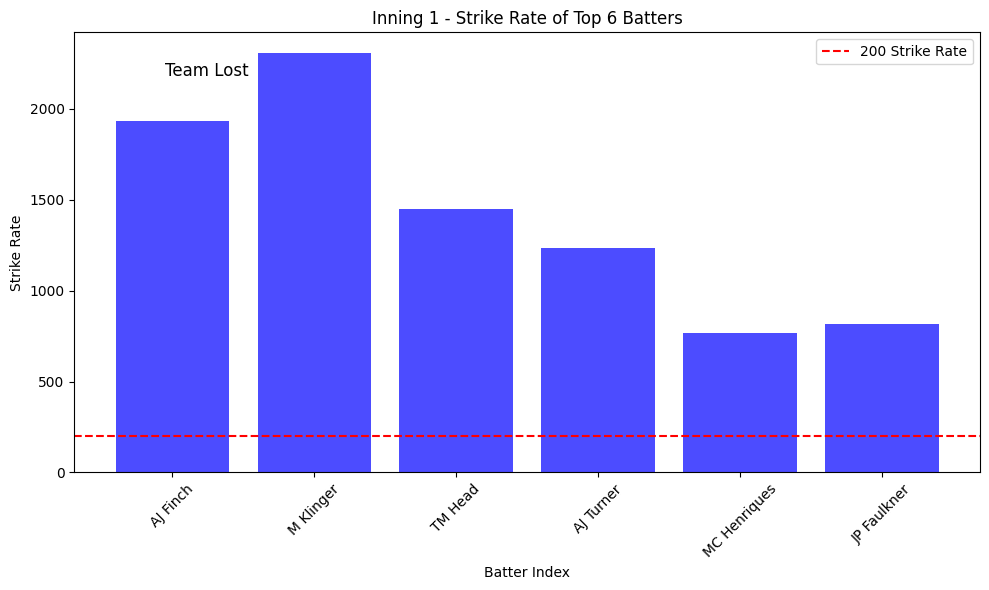

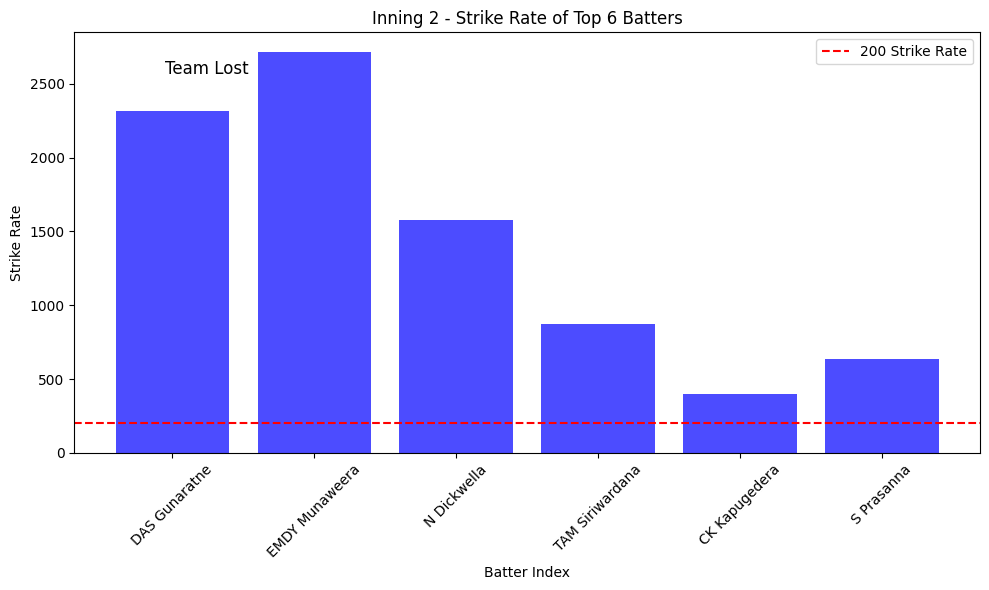

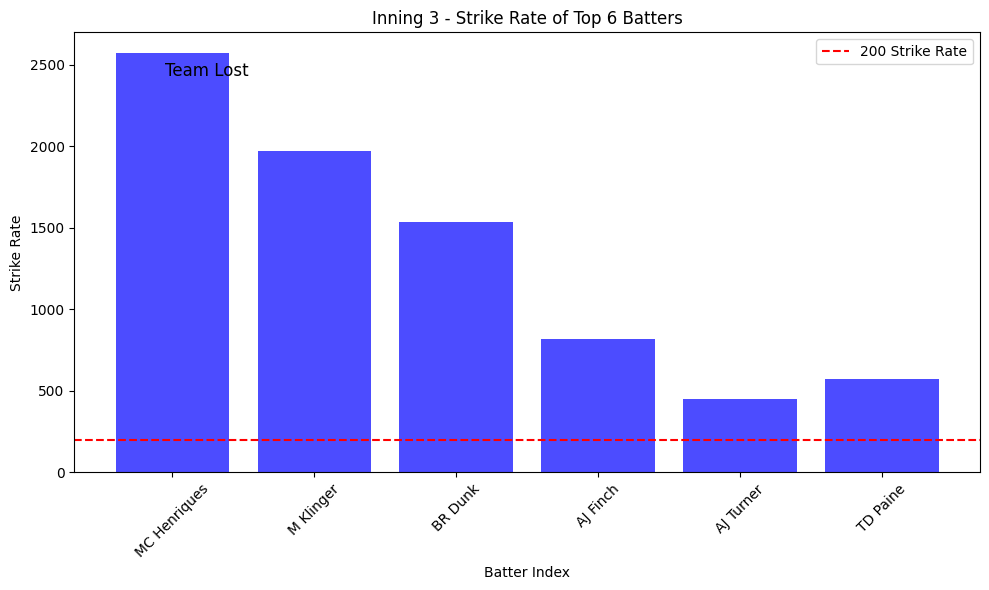

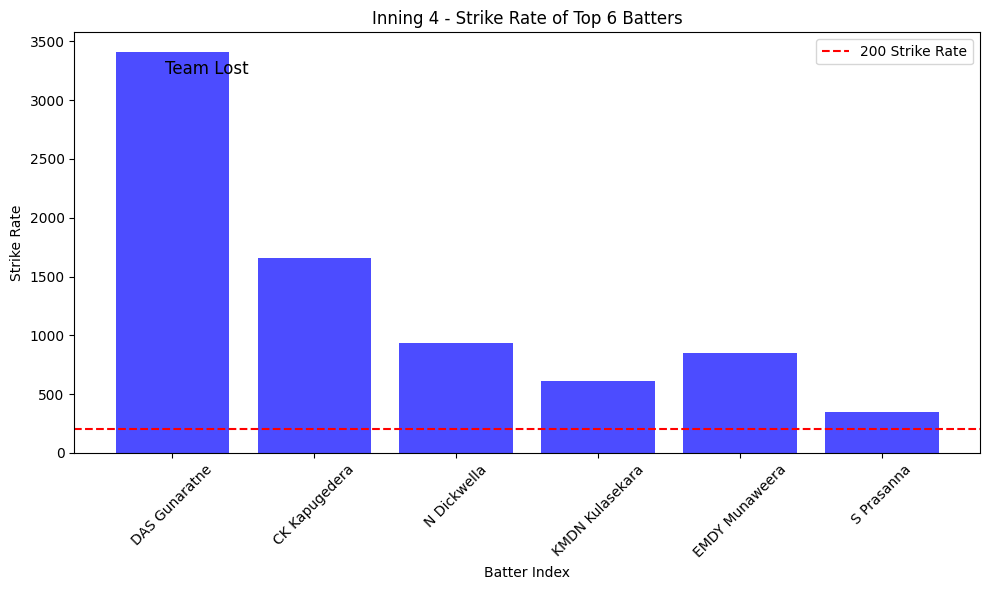

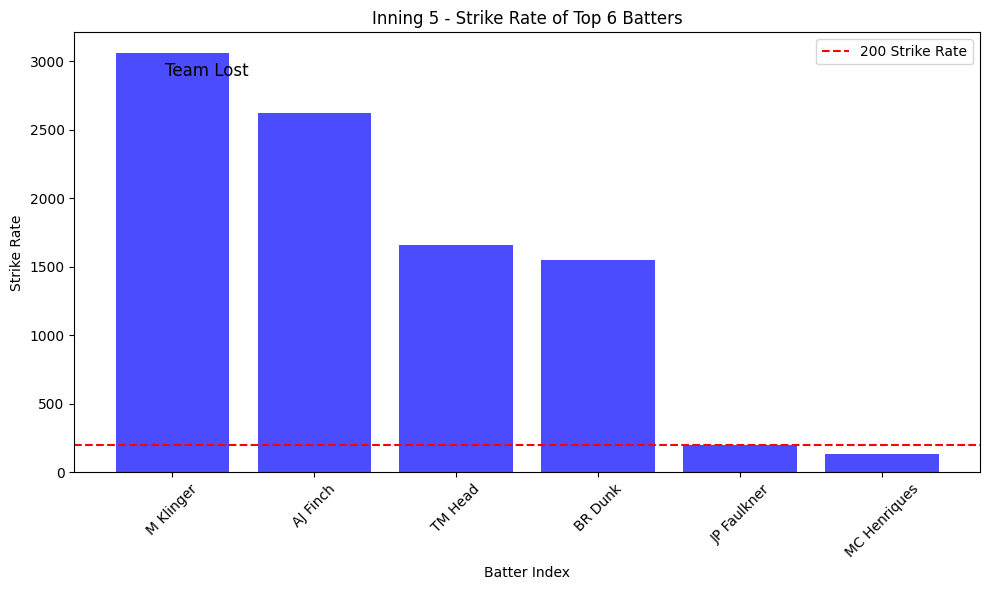

...

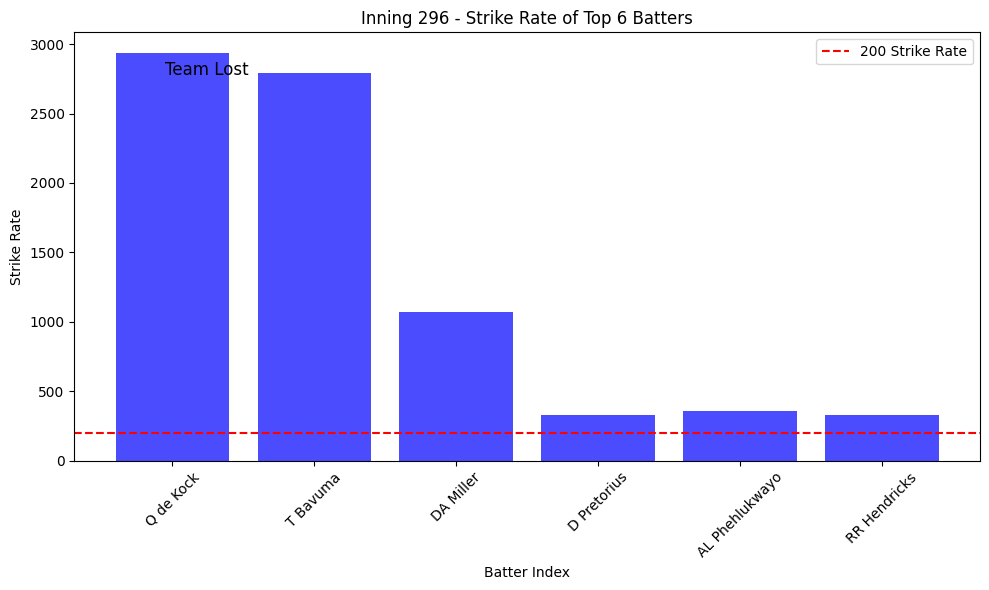

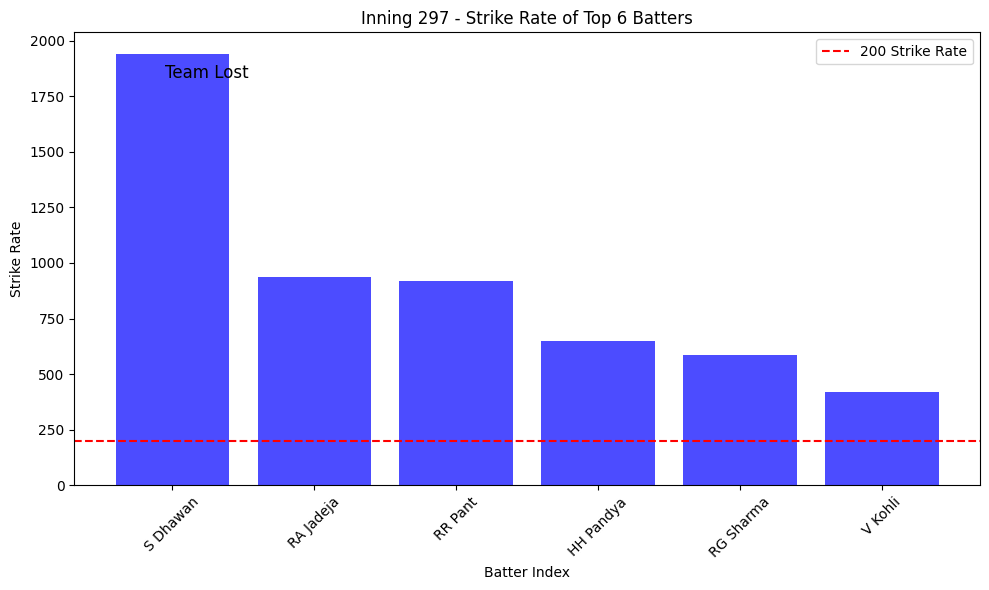

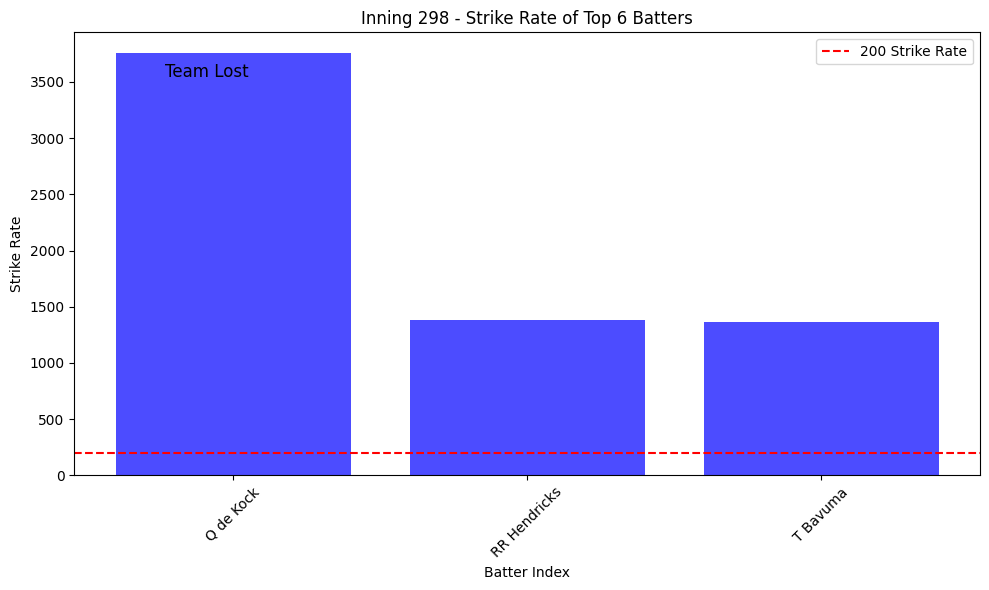

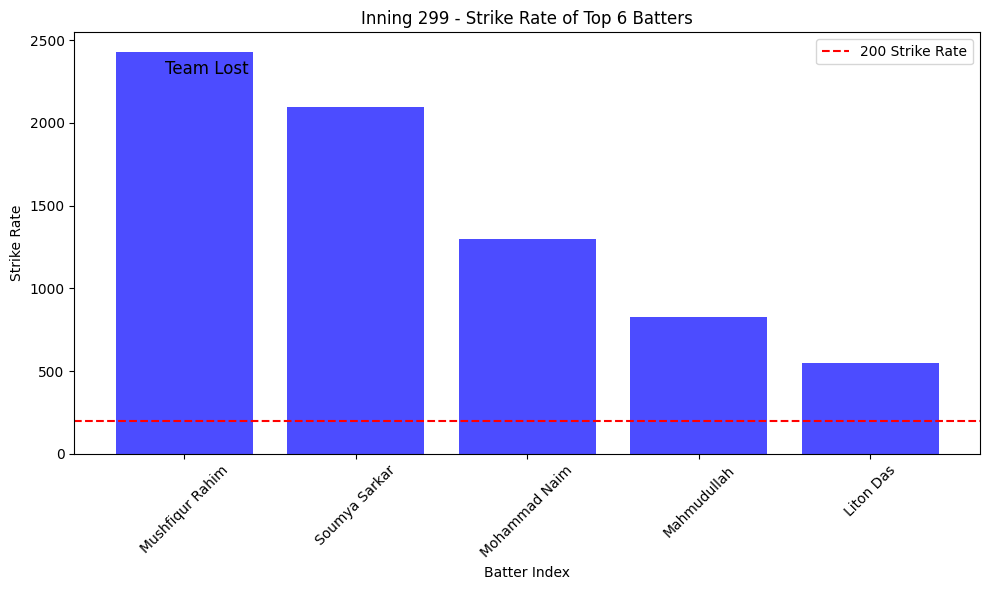

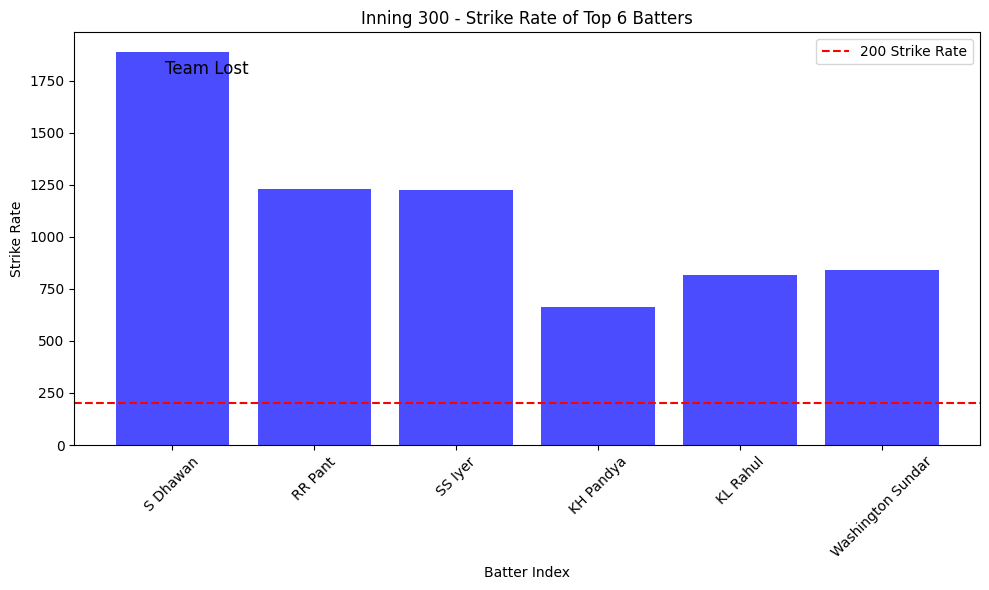

KeyboardInterrupt: 

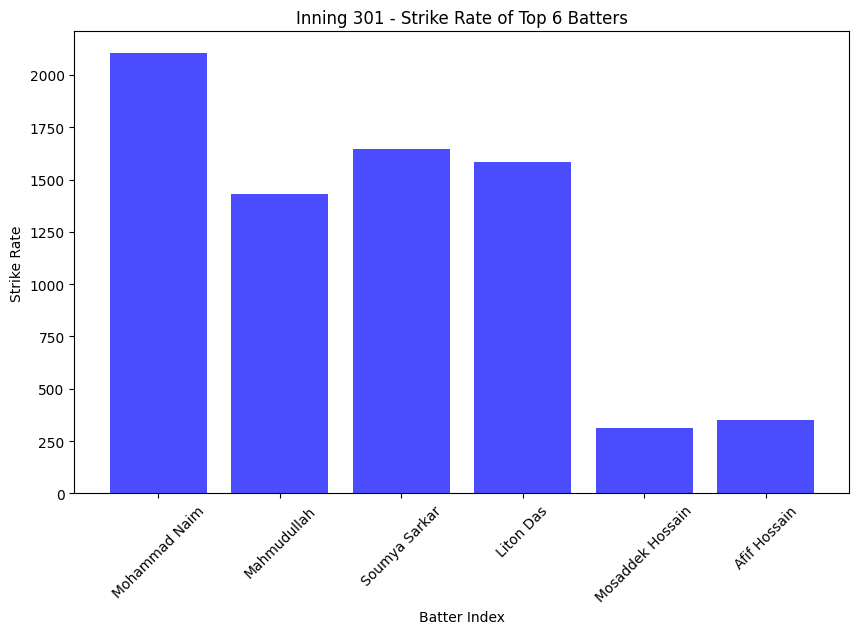

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
data = pd.read_csv('../Data/selected_data/merged_data.csv')

# Function to calculate stats for the first 6 batters in an inning
def get_top6_batsmen(inning_df):
    # Group by 'batter' and aggregate statistics
    batsmen_stats = inning_df.groupby('batter').agg({
        'runs_by_bat': 'sum',
        'balls_faced': 'max',  # Maximum balls faced
        'batter_runs': 'sum'
    })
    
    # Calculate strike rate
    batsmen_stats['strike_rate'] = batsmen_stats['batter_runs'] / batsmen_stats['balls_faced'] * 100
    
    # Sort by runs scored in descending order
    batsmen_stats = batsmen_stats.sort_values(by='runs_by_bat', ascending=False)
    
    # Select the first 6 batters
    top6_batsmen = batsmen_stats.head(6).reset_index()
    
    return top6_batsmen

# Identify inning boundaries
inning_boundaries_indices = data[data['Index'] == 0].index
inning_boundaries_indices = list(inning_boundaries_indices) + [len(data)]  # Add end index for last inning

# Create an empty list to store DataFrame for each inning
inning_data = []

# Iterate through each inning data
for i in range(len(inning_boundaries_indices) - 1):
    start_index = inning_boundaries_indices[i]
    end_index = inning_boundaries_indices[i + 1]
    inning_df = data.iloc[start_index:end_index]

    top6_batsmen = get_top6_batsmen(inning_df)
    top6_batsmen['inning'] = i + 1  # Add inning number to the DataFrame
    
    # Get the winning team for the inning
    winning_team = inning_df['winning_team'].iloc[0]
    
    # Add winning team column to the DataFrame
    top6_batsmen['winning_team'] = winning_team
    
    # Append inning data to the list
    inning_data.append(top6_batsmen)

# Plotting inning by inning
for inning_df in inning_data:
    inning_num = inning_df['inning'].iloc[0]
    
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.bar(inning_df.index, inning_df['strike_rate'], color='blue', alpha=0.7)
    plt.xlabel('Batter Index')
    plt.ylabel('Strike Rate')
    plt.title(f'Inning {inning_num} - Strike Rate of Top 6 Batters')
    plt.xticks(inning_df.index, inning_df['batter'], rotation=45)
    plt.axhline(y=200, color='red', linestyle='--', label='200 Strike Rate')
    plt.legend()
    
    # Indicate if the team won or not
    if inning_df['winning_team'].iloc[0] == '1':
        plt.text(0.1, 0.9, 'Team Won', fontsize=12, transform=plt.gca().transAxes)
    else:
        plt.text(0.1, 0.9, 'Team Lost', fontsize=12, transform=plt.gca().transAxes)
    
    plt.tight_layout()
    plt.show()


In [9]:
import pandas as pd

# Load the data
data = pd.read_csv('../Data/selected_data/merged_data.csv')

# Function to calculate stats for the first 6 batters in an inning
def get_top6_batsmen(inning_df):
    # Group by 'batter' and aggregate statistics
    batsmen_stats = inning_df.groupby('batter').agg({
        'runs_by_bat': 'sum',
        'balls_faced': 'max',  # Maximum balls faced
        'batter_runs': 'sum'
    })
    
    # Calculate strike rate
    batsmen_stats['strike_rate'] = batsmen_stats['batter_runs'] / batsmen_stats['balls_faced'] * 100
    
    # Sort by runs scored in descending order
    batsmen_stats = batsmen_stats.sort_values(by='runs_by_bat', ascending=False)
    
    # Select the first 6 batters
    top6_batsmen = batsmen_stats.head(6).reset_index()
    
    return top6_batsmen

# Identify inning boundaries
inning_boundaries_indices = data[data['Index'] == 0].index
inning_boundaries_indices = list(inning_boundaries_indices) + [len(data)]  # Add end index for last inning

# Initialize counters
total_innings = 0
wins_with_high_strike_rate = 0

# Iterate through each inning data
for i in range(len(inning_boundaries_indices) - 1):
    start_index = inning_boundaries_indices[i]
    end_index = inning_boundaries_indices[i + 1]
    inning_df = data.iloc[start_index:end_index]

    top6_batsmen = get_top6_batsmen(inning_df)
    
    # Check if all strike rates are greater than 130
    if (top6_batsmen['strike_rate'] > 130).all():
        total_innings += 1
        
        # Check if the batting team is the winning team
        if inning_df['batting_team'].iloc[0] == inning_df['winning_team'].iloc[0]:
            wins_with_high_strike_rate += 1

# Calculate probability
probability = wins_with_high_strike_rate / total_innings if total_innings > 0 else 0

print("Probability of winning when all first six players' strike rates are greater than 130:", probability)


C:\Users\BIMBARA\AppData\Local\Temp\ipykernel_27396\878954120.py:4: DtypeWarning: Columns (33,34) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../Data/selected_data/merged_data.csv')


Probability of winning when all first six players' strike rates are greater than 130: 0.44948849104859334


C:\Users\BIMBARA\AppData\Local\Temp\ipykernel_27396\77171701.py:5: DtypeWarning: Columns (33,34) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../Data/selected_data/merged_data.csv')


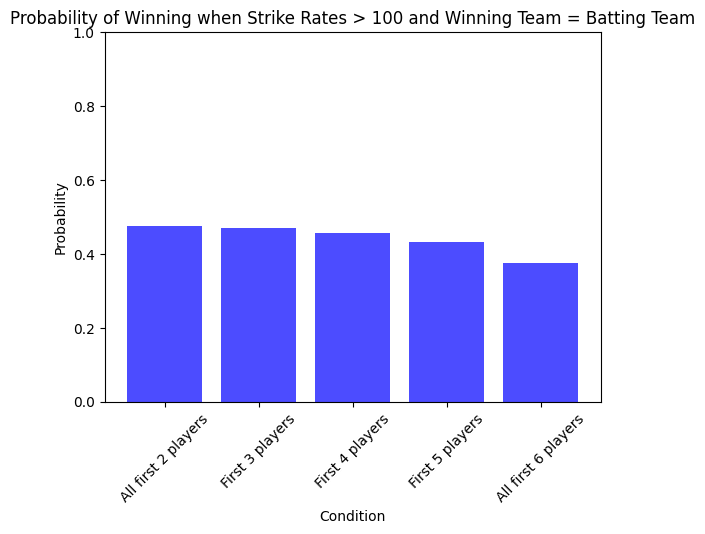

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
data = pd.read_csv('../Data/selected_data/merged_data.csv')

# Function to calculate stats for the first 6 batters in an inning
def get_top6_batsmen(inning_df):
    # Group by 'batter' and aggregate statistics
    batsmen_stats = inning_df.groupby('batter').agg({
        'runs_by_bat': 'sum',
        'balls_faced': 'max',  # Maximum balls faced
        'batter_runs': 'sum'
    })
    
    # Calculate strike rate
    batsmen_stats['strike_rate'] = batsmen_stats['batter_runs'] / batsmen_stats['balls_faced'] * 100
    
    # Sort by runs scored in descending order
    batsmen_stats = batsmen_stats.sort_values(by='runs_by_bat', ascending=False)
    
    # Select the first 6 batters
    top6_batsmen = batsmen_stats.head(6).reset_index()
    
    return top6_batsmen

# Identify inning boundaries
inning_boundaries_indices = data[data['Index'] == 0].index
inning_boundaries_indices = list(inning_boundaries_indices) + [len(data)]  # Add end index for last inning

# Initialize dictionaries to store probabilities for each condition
probabilities = {'All first 2 players': 0, 'First 3 players': 0, 'First 4 players': 0, 'First 5 players': 0, 'All first 6 players': 0}

# Iterate through each inning data
for i in range(len(inning_boundaries_indices) - 1):
    start_index = inning_boundaries_indices[i]
    end_index = inning_boundaries_indices[i + 1]
    inning_df = data.iloc[start_index:end_index]

    top6_batsmen = get_top6_batsmen(inning_df)
    
    # Check conditions and update probabilities accordingly
    if (top6_batsmen['strike_rate'].iloc[:2] > 100).all() and inning_df['batting_team'].iloc[0] == inning_df['winning_team'].iloc[0]:
        probabilities['All first 2 players'] += 1
    if (top6_batsmen['strike_rate'].iloc[:3] > 100).all() and inning_df['batting_team'].iloc[0] == inning_df['winning_team'].iloc[0]:
        probabilities['First 3 players'] += 1
    if (top6_batsmen['strike_rate'].iloc[:4] > 100).all() and inning_df['batting_team'].iloc[0] == inning_df['winning_team'].iloc[0]:
        probabilities['First 4 players'] += 1
    if (top6_batsmen['strike_rate'].iloc[:5] > 100).all() and inning_df['batting_team'].iloc[0] == inning_df['winning_team'].iloc[0]:
        probabilities['First 5 players'] += 1
    if (top6_batsmen['strike_rate'] > 100).all() and inning_df['batting_team'].iloc[0] == inning_df['winning_team'].iloc[0]:
        probabilities['All first 6 players'] += 1

# Calculate probabilities
total_innings = len(inning_boundaries_indices) - 1
for key in probabilities:
    probabilities[key] /= total_innings

# Plotting
plt.bar(probabilities.keys(), probabilities.values(), color='blue', alpha=0.7)
plt.xlabel('Condition')
plt.ylabel('Probability')
plt.title('Probability of Winning when Strike Rates > 100 and Winning Team = Batting Team')
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.show()
